### Imports

In [12]:
import pandas as pd
import numpy as np
import geopandas as gpd

In [13]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline 
mpl.rcParams['figure.dpi'] = 300

In [14]:
from sklearn.preprocessing import Normalizer

In [15]:
from chart_studio import plotly
import plotly.figure_factory as ff

In [16]:
pd.options.display.max_rows = 4000
pd.options.display.max_columns = 4000

In [17]:
DATA_VERSION = 'v5'

In [18]:
gov_arch_csv = '../data/' + DATA_VERSION + '/communities_data_prepped.csv'

In [19]:
fig_dir = '../' + DATA_VERSION + '-fig/fig-communities/'

In [20]:
gov_df = pd.read_csv(gov_arch_csv)

In [21]:
gov_df.head()

,Name,Institutions,Mechanism,Notes,Time span,Geography,Size,Source,Metanotes,Heterogeneity,FC comments,expert check,Time span: Start,Time span: End,SCCS,is_SCCS,access_mechanisms_include_property_requirement,access_mechanisms_include_heredity,access_mechanisms_include_life_appointment,decision_making_mechanisms_include_board_committee,decision_making_mechanisms_include_president_consul_chief_executive,decision_making_mechanisms_include_quorum,enforcement_mechanisms_include_capital_punishment,decision_making_mechanisms_include_council_local,enforcement_mechanisms_include_self-help,decision_making_mechanisms_include_assembly_central,decision_making_mechanisms_include_turnover_rotation,enforcement_mechanisms_include_fines,decision_making_mechanisms_include_bureaucracy,decision_making_mechanisms_include_frequent_and_or_regular_meetings,decision_making_mechanisms_include_power_fluidity,enforcement_mechanisms_include_negotiation,decision_making_mechanisms_include_temporary_position_of_power_term_limits,decision_making_mechanisms_include_alliance,decision_making_mechanisms_include_lobbying,enforcement_mechanisms_include_monitoring,decision_making_mechanisms_include_consultation,decision_making_mechanisms_include_magistrate_official,decision_making_mechanisms_include_gathering,enforcement_mechanisms_include_civil_disobedience,enforcement_mechanisms_include_arbitration,decision_making_mechanisms_include_leader_first_among_equals,decision_making_mechanisms_include_secret_ballot,decision_making_mechanisms_include_veto,decision_making_mechanisms_include_council_central_,access_mechanisms_include_screening_process,enforcement_mechanisms_include_judicial_review,decision_making_mechanisms_include_petition,access_mechanisms_include_child_participation,decision_making_mechanisms_include_constitution,decision_making_mechanisms_include_coalition,access_mechanisms_include_matriarchy,enforcement_mechanisms_include_destruction_of_property,decision_making_mechanisms_include_rule_of_law,access_mechanisms_include_meritocracy,access_mechanisms_include_dreaming,decision_making_mechanisms_include_dual-sex_political_system,decision_making_mechanisms_include_public_meetings,enforcement_mechanisms_include_corporal_punishment_violence_against_perpetrator,enforcement_mechanisms_include_criticism_mocking_joking,decision_making_mechanisms_include_balance_of_power,access_mechanisms_include_open_political_unit,access_mechanisms_include_female_participation,decision_making_mechanisms_include_kingchief-as-figurehead,access_mechanisms_include_matrilineality,decision_making_mechanisms_include_delegation,access_mechanisms_include_enfranchisement,decision_making_mechanisms_include_agenda_setting,decision_making_mechanisms_include_group_voting,decision_making_mechanisms_include_majority_voting,enforcement_mechanisms_include_seizing_of_property,enforcement_mechanisms_include_litigation,decision_making_mechanisms_include_ratification_acclamation_only,enforcement_mechanisms_include_tribunal_court_,access_mechanisms_include_induction_rite_ceremony,enforcement_mechanisms_include_graduated_sanctions,access_mechanisms_include_blood_relations,decision_making_mechanisms_include_word_of_mouth,decision_making_mechanisms_include_confederacy,access_mechanisms_include_lottery_random_selection,decision_making_mechanisms_include_checks_and_balances,access_mechanisms_include_co-optation,decision_making_mechanisms_include_autocratic_leader_unbound,decision_making_mechanisms_include_vote_by_proxy,enforcement_mechanisms_include_reputational_risk,decision_making_mechanisms_include_assembly_local,enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,access_mechanisms_include_patronage_for_office,access_mechanisms_include_payment_for_occupying_office,decision_making_mechanisms_include_mandate,decision_making_mechanisms_include_plurality_voting,decision_making_mechanisms_include_assembly_elite,decision_making_mechanisms_include_vote_by_show_of_hands,access_mechanisms_inclu

In [22]:
gov_df.dtypes

Name                                                                               object
Institutions                                                                       object
Mechanism                                                                          object
Notes                                                                              object
Time span                                                                          object
Geography                                                                          object
Size                                                                               object
Source                                                                             object
Metanotes                                                                          object
Heterogeneity                                                                      object
FC comments                                                                        object
expert che

## Descriptive analysis

## Histograms

In [23]:
list(gov_df.columns)

['Name',
 'Institutions',
 'Mechanism',
 'Notes',
 'Time span',
 'Geography',
 'Size',
 'Source',
 'Metanotes',
 'Heterogeneity ',
 'FC comments',
 'expert check',
 'Time span: Start',
 'Time span: End',
 'SCCS',
 'is_SCCS',
 'access_mechanisms_include_property_requirement',
 'access_mechanisms_include_heredity',
 'access_mechanisms_include_life_appointment',
 'decision_making_mechanisms_include_board_committee',
 'decision_making_mechanisms_include_president_consul_chief_executive',
 'decision_making_mechanisms_include_quorum',
 'enforcement_mechanisms_include_capital_punishment',
 'decision_making_mechanisms_include_council_local',
 'enforcement_mechanisms_include_self-help',
 'decision_making_mechanisms_include_assembly_central',
 'decision_making_mechanisms_include_turnover_rotation',
 'enforcement_mechanisms_include_fines',
 'decision_making_mechanisms_include_bureaucracy',
 'decision_making_mechanisms_include_frequent_and_or_regular_meetings',
 'decision_making_mechanisms_include

In [24]:
mechanisms_list = [x for x in gov_df.columns if 'mechanisms' in x]
mechanisms_list

['access_mechanisms_include_property_requirement',
 'access_mechanisms_include_heredity',
 'access_mechanisms_include_life_appointment',
 'decision_making_mechanisms_include_board_committee',
 'decision_making_mechanisms_include_president_consul_chief_executive',
 'decision_making_mechanisms_include_quorum',
 'enforcement_mechanisms_include_capital_punishment',
 'decision_making_mechanisms_include_council_local',
 'enforcement_mechanisms_include_self-help',
 'decision_making_mechanisms_include_assembly_central',
 'decision_making_mechanisms_include_turnover_rotation',
 'enforcement_mechanisms_include_fines',
 'decision_making_mechanisms_include_bureaucracy',
 'decision_making_mechanisms_include_frequent_and_or_regular_meetings',
 'decision_making_mechanisms_include_power_fluidity',
 'enforcement_mechanisms_include_negotiation',
 'decision_making_mechanisms_include_temporary_position_of_power_term_limits',
 'decision_making_mechanisms_include_alliance',
 'decision_making_mechanisms_incl

In [25]:
# mechanisms_df = gov_df[['Name'] + mechanisms_list]
mechanisms_df = gov_df[mechanisms_list]

In [26]:
mechanisms_df

,access_mechanisms_include_property_requirement,access_mechanisms_include_heredity,access_mechanisms_include_life_appointment,decision_making_mechanisms_include_board_committee,decision_making_mechanisms_include_president_consul_chief_executive,decision_making_mechanisms_include_quorum,enforcement_mechanisms_include_capital_punishment,decision_making_mechanisms_include_council_local,enforcement_mechanisms_include_self-help,decision_making_mechanisms_include_assembly_central,decision_making_mechanisms_include_turnover_rotation,enforcement_mechanisms_include_fines,decision_making_mechanisms_include_bureaucracy,decision_making_mechanisms_include_frequent_and_or_regular_meetings,decision_making_mechanisms_include_power_fluidity,enforcement_mechanisms_include_negotiation,decision_making_mechanisms_include_temporary_position_of_power_term_limits,decision_making_mechanisms_include_alliance,decision_making_mechanisms_include_lobbying,enforcement_mechanisms_include_monitoring,decision_making_mechanisms_include_consultation,decision_making_mechanisms_include_magistrate_official,decision_making_mechanisms_include_gathering,enforcement_mechanisms_include_civil_disobedience,enforcement_mechanisms_include_arbitration,decision_making_mechanisms_include_leader_first_among_equals,decision_making_mechanisms_include_secret_ballot,decision_making_mechanisms_include_veto,decision_making_mechanisms_include_council_central_,access_mechanisms_include_screening_process,enforcement_mechanisms_include_judicial_review,decision_making_mechanisms_include_petition,access_mechanisms_include_child_participation,decision_making_mechanisms_include_constitution,decision_making_mechanisms_include_coalition,access_mechanisms_include_matriarchy,enforcement_mechanisms_include_destruction_of_property,decision_making_mechanisms_include_rule_of_law,access_mechanisms_include_meritocracy,access_mechanisms_include_dreaming,decision_making_mechanisms_include_dual-sex_political_system,decision_making_mechanisms_include_public_meetings,enforcement_mechanisms_include_corporal_punishment_violence_against_perpetrator,enforcement_mechanisms_include_criticism_mocking_joking,decision_making_mechanisms_include_balance_of_power,access_mechanisms_include_open_political_unit,access_mechanisms_include_female_participation,decision_making_mechanisms_include_kingchief-as-figurehead,access_mechanisms_include_matrilineality,decision_making_mechanisms_include_delegation,access_mechanisms_include_enfranchisement,decision_making_mechanisms_include_agenda_setting,decision_making_mechanisms_include_group_voting,decision_making_mechanisms_include_majority_voting,enforcement_mechanisms_include_seizing_of_property,enforcement_mechanisms_include_litigation,decision_making_mechanisms_include_ratification_acclamation_only,enforcement_mechanisms_include_tribunal_court_,access_mechanisms_include_induction_rite_ceremony,enforcement_mechanisms_include_graduated_sanctions,access_mechanisms_include_blood_relations,decision_making_mechanisms_include_word_of_mouth,decision_making_mechanisms_include_confederacy,access_mechanisms_include_lottery_random_selection,decision_making_mechanisms_include_checks_and_balances,access_mechanisms_include_co-optation,decision_making_mechanisms_include_autocratic_leader_unbound,decision_making_mechanisms_include_vote_by_proxy,enforcement_mechanisms_include_reputational_risk,decision_making_mechanisms_include_assembly_local,enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,access_mechanisms_include_patronage_for_office,access_mechanisms_include_payment_for_occupying_office,decision_making_mechanisms_include_mandate,decision_making_mechanisms_include_plurality_voting,decision_making_mechanisms_include_assembly_elite,decision_making_mechanisms_include_vote_by_show_of_hands,access_mechanisms_include_age_boundaries,access_mechanisms_include_gerontocracy,enforcement_mechanisms_include_paying_damages_compensation,enforcement_mechanisms_include_police,decisi

In [27]:
mechanisms_df.sum().sort_values(ascending=False)

decision_making_mechanisms_include_magistrate_official                             61
decision_making_mechanisms_include_council_central_                                53
access_mechanisms_include_meritocracy                                              40
access_mechanisms_include_heredity                                                 40
decision_making_mechanisms_include_autocratic_leader_chief_bound                   38
access_mechanisms_include_gerontocracy                                             36
decision_making_mechanisms_include_deliberation                                    34
decision_making_mechanisms_include_council_local                                   28
access_mechanisms_include_election                                                 28
decision_making_mechanisms_include_assembly_central                                27
decision_making_mechanisms_include_consensus                                       25
decision_making_mechanisms_include_representation     

<Axes: >

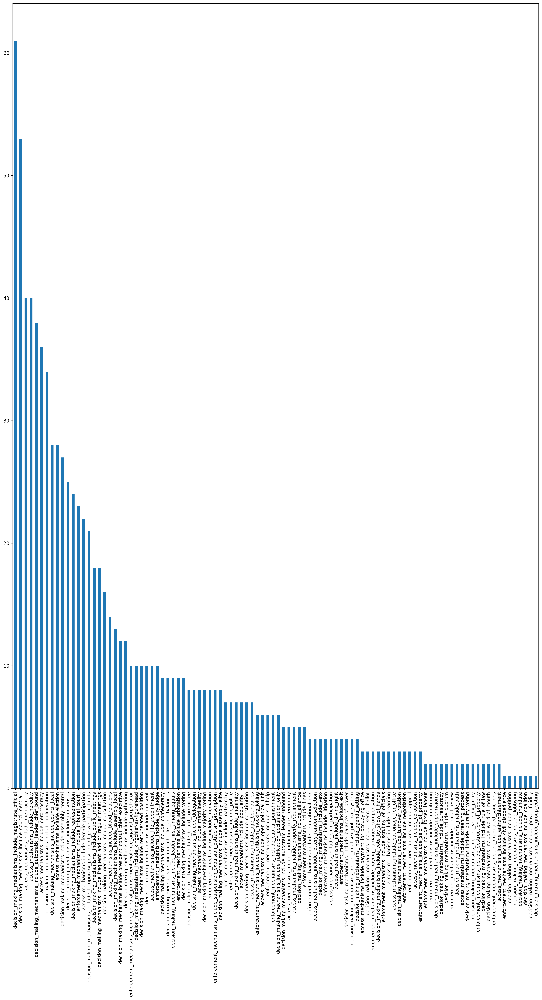

In [28]:
mechanisms_df.sum().sort_values(ascending=False).plot(kind='bar', figsize=(20,30))

## By Mechanism category

In [29]:
access_mechanisms = [x for x in gov_df.columns if 'access_mechanisms_' in x]

<Axes: >

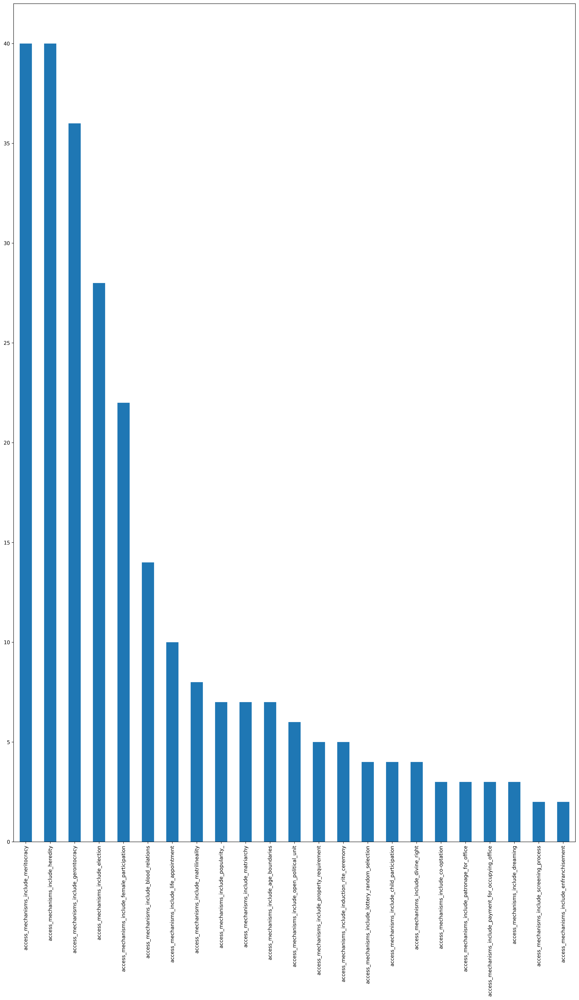

In [30]:
gov_df[access_mechanisms].sum().sort_values(ascending=False).plot(kind='bar', figsize=(20,30))

In [31]:
decision_making_mechanisms = [x for x in gov_df.columns if 'decision_making_mechanisms_' in x]

<Axes: >

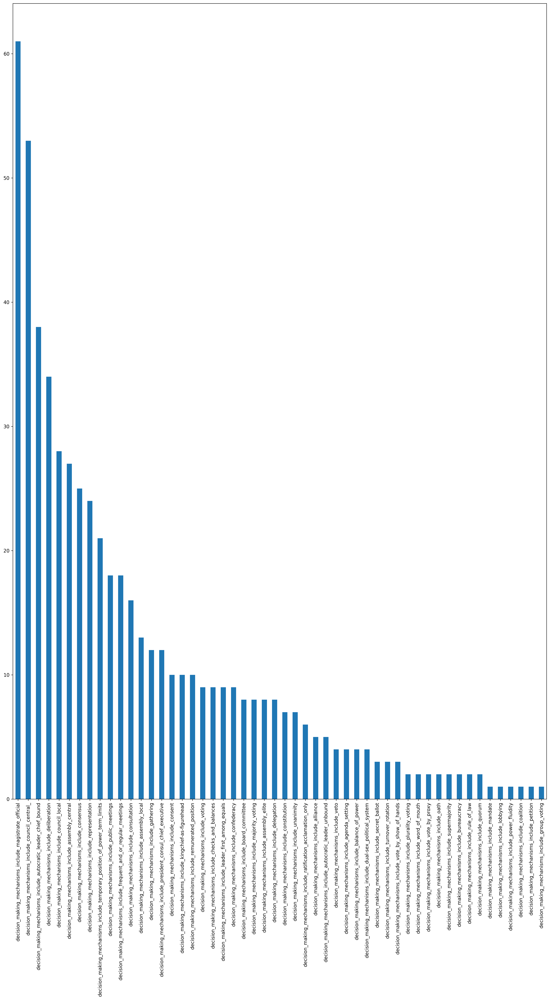

In [32]:
gov_df[decision_making_mechanisms].sum().sort_values(ascending=False).plot(kind='bar', figsize=(20,30))

In [33]:
enforcement_mechanisms = [x for x in gov_df.columns if 'enforcement_mechanisms_' in x]

<Axes: >

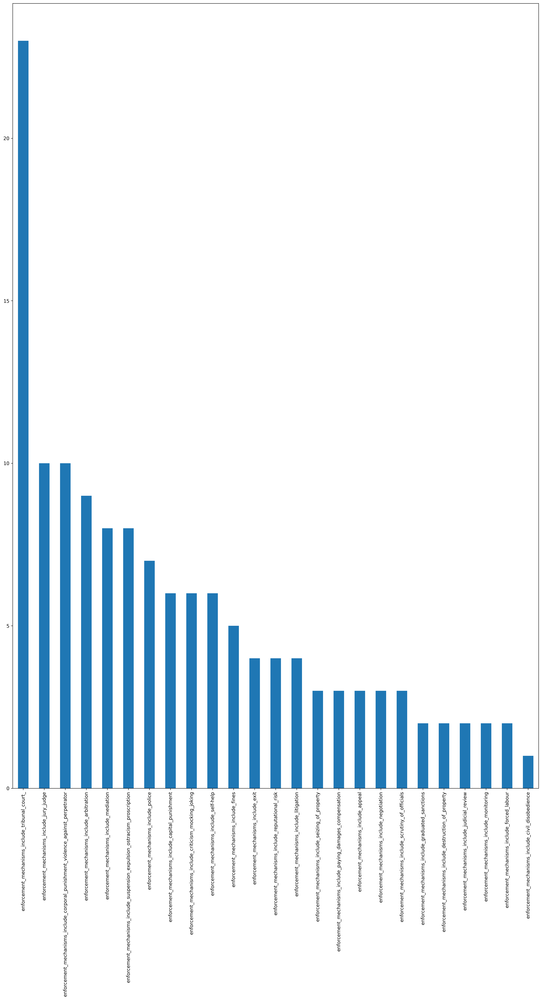

In [34]:
gov_df[enforcement_mechanisms].sum().sort_values(ascending=False).plot(kind='bar', figsize=(20,30))

### Values

In [35]:
# values_list = [x for x in gov_df.columns if x.startswith('values')]
# values_list

In [36]:
# values_df = gov_df[['Name'] + values_list]
# values_df = gov_df[values_list]

In [37]:
# values_df

In [38]:
# values_df.sum().sort_values(ascending=False)

In [39]:
# values_df.sum().sort_values(ascending=False).plot(kind='bar', figsize=(10,30))

Note:
- Mechanisms are not mutually exclusive! Many/most institutions involve multiple mechanisms.
- Values are also not mutually exclusive! Many/most institutions involve multiple values. 

### Size

In [40]:
gov_df['Size'].value_counts()

Size
10,001 - 100,000          37
1,001 - 10,000            22
100,001 - 1,000,000       10
Unknown                    7
1,000,001 - 10,000,000     6
100 - 1,000                5
10,000,000+                4
Name: count, dtype: int64

In [41]:
gov_df['Size']

0        100,001 - 1,000,000
1           10,001 - 100,000
2           10,001 - 100,000
3                    Unknown
4             1,001 - 10,000
5        100,001 - 1,000,000
6        100,001 - 1,000,000
7           10,001 - 100,000
8        100,001 - 1,000,000
9           10,001 - 100,000
10               10,000,000+
11                   Unknown
12          10,001 - 100,000
13          10,001 - 100,000
14          10,001 - 100,000
15          10,001 - 100,000
16    1,000,001 - 10,000,000
17    1,000,001 - 10,000,000
18            1,001 - 10,000
19          10,001 - 100,000
20          10,001 - 100,000
21          10,001 - 100,000
22          10,001 - 100,000
23          10,001 - 100,000
24          10,001 - 100,000
25                   Unknown
26          10,001 - 100,000
27    1,000,001 - 10,000,000
28          10,001 - 100,000
29            1,001 - 10,000
30          10,001 - 100,000
31          10,001 - 100,000
32          10,001 - 100,000
33               10,000,000+
34            

<Axes: xlabel='Size'>

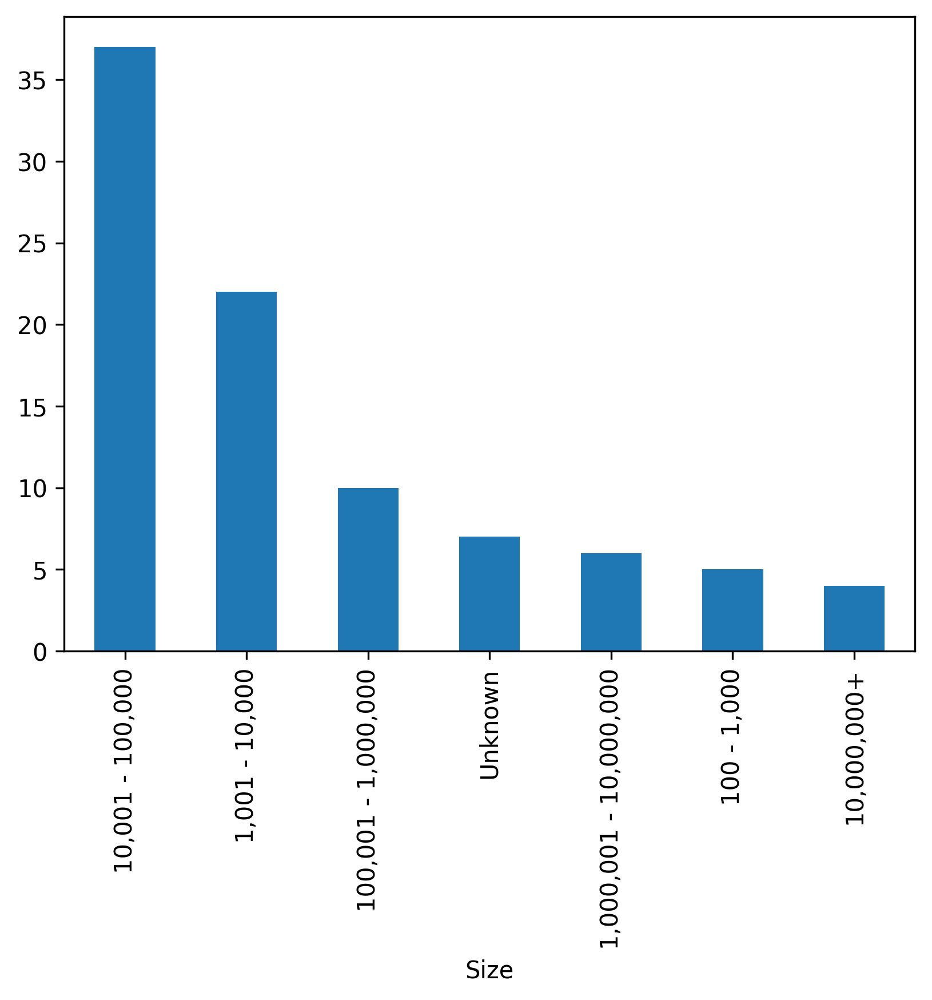

In [42]:
gov_df['Size'].value_counts().plot(kind='bar')

In [43]:
size_order = [
    '100 - 1,000',
    '1,001 - 10,000',
    '10,001 - 100,000',
    '100,001 - 1,000,000',
    '1,000,001 - 10,000,000',
    '10,000,000+',
    'Unknown'
]

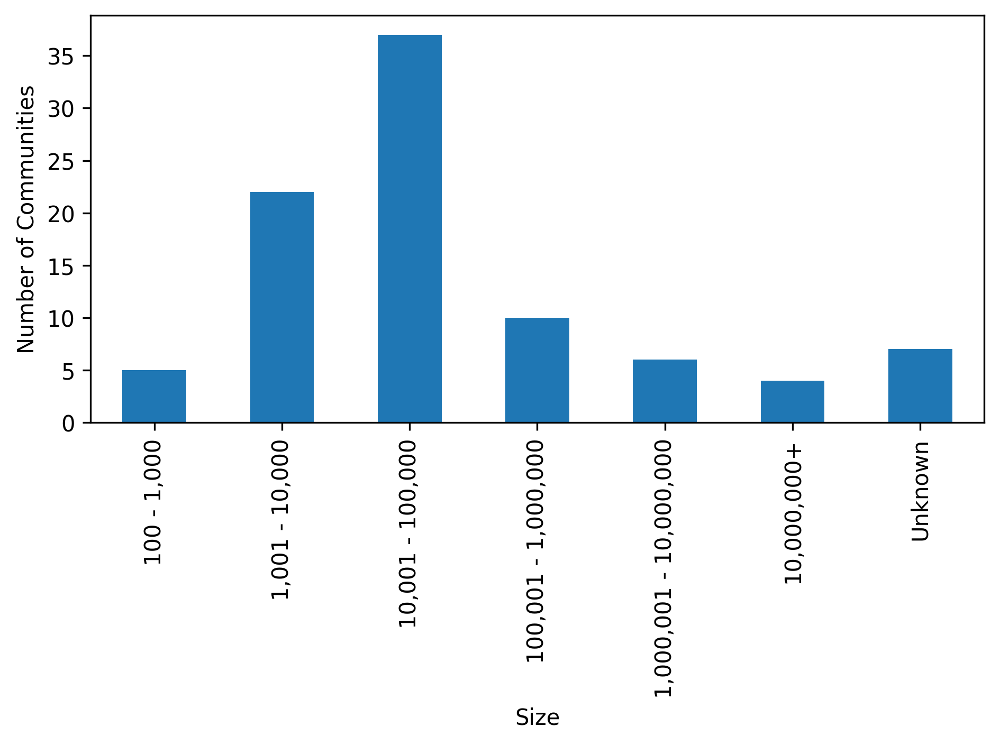

In [44]:
gov_df['Size'].value_counts().loc[size_order].plot.bar()
plt.ylabel("Number of Communities")

plt.tight_layout()
plt.savefig(fig_dir + 'communities_histogram_size.png')
plt.show()

In [45]:
gov_df['Size']

0        100,001 - 1,000,000
1           10,001 - 100,000
2           10,001 - 100,000
3                    Unknown
4             1,001 - 10,000
5        100,001 - 1,000,000
6        100,001 - 1,000,000
7           10,001 - 100,000
8        100,001 - 1,000,000
9           10,001 - 100,000
10               10,000,000+
11                   Unknown
12          10,001 - 100,000
13          10,001 - 100,000
14          10,001 - 100,000
15          10,001 - 100,000
16    1,000,001 - 10,000,000
17    1,000,001 - 10,000,000
18            1,001 - 10,000
19          10,001 - 100,000
20          10,001 - 100,000
21          10,001 - 100,000
22          10,001 - 100,000
23          10,001 - 100,000
24          10,001 - 100,000
25                   Unknown
26          10,001 - 100,000
27    1,000,001 - 10,000,000
28          10,001 - 100,000
29            1,001 - 10,000
30          10,001 - 100,000
31          10,001 - 100,000
32          10,001 - 100,000
33               10,000,000+
34            

### Geography 

In [46]:
gov_df['Geography'].value_counts()

Geography
North America                          12
Europe South, Italy                     7
Europe West                             5
Africa                                  5
Middle East                             4
Europe East                             3
Central America                         3
Asia, India (northeast)                 3
Asia Southeast                          3
Asia Southeast                          2
Europe South, Greece                    2
North America, Canada                   2
South America, Brazil                   2
Central America, Mexico                 2
Asia, South                             2
Middle East MENA                        1
North America, Alaska                   1
North America, Louisiana                1
Asia Southeast, Bali                    1
Asia, India                             1
Asia, East                              1
Oceania, eastern Polynesia              1
Oceania, New Zealand                    1
South America, Patagonia

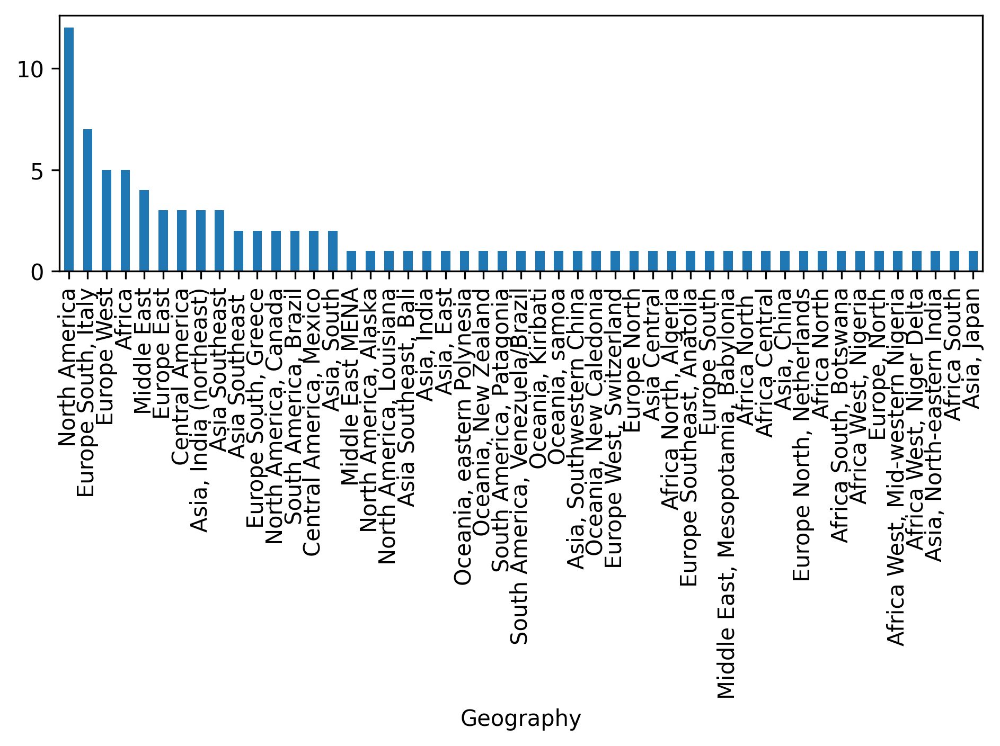

In [47]:
gov_df['Geography'].value_counts().plot(kind='bar')

plt.tight_layout()
plt.savefig(fig_dir + 'communities_histogram_geography.png')
plt.show()

In [48]:
"""
- Africa
- Europe
- Asia
- Middle East
- North America
- Central America
- South America
- Oceania
"""

'\n- Africa\n- Europe\n- Asia\n- Middle East\n- North America\n- Central America\n- South America\n- Oceania\n'

In [49]:
gov_df['Geography']

0                            Europe North
1                         Asia Southeast 
2                             Europe West
3                             Middle East
4              Europe Southeast, Anatolia
5                            Europe South
6                 Central America, Mexico
7     Middle East, Mesopotamia, Babylonia
8                           Africa North 
9                          Africa Central
10                            Asia, China
11                            Europe East
12                            Europe West
13                            Europe West
14              Europe North, Netherlands
15                            Middle East
16                           Africa North
17                            Europe West
18                 Africa South, Botswana
19                    Europe South, Italy
20                    Europe South, Italy
21                   Europe South, Greece
22                   Europe South, Greece
23                          North 

### Geography 

In [50]:
gov_df.head()

,Name,Institutions,Mechanism,Notes,Time span,Geography,Size,Source,Metanotes,Heterogeneity,FC comments,expert check,Time span: Start,Time span: End,SCCS,is_SCCS,access_mechanisms_include_property_requirement,access_mechanisms_include_heredity,access_mechanisms_include_life_appointment,decision_making_mechanisms_include_board_committee,decision_making_mechanisms_include_president_consul_chief_executive,decision_making_mechanisms_include_quorum,enforcement_mechanisms_include_capital_punishment,decision_making_mechanisms_include_council_local,enforcement_mechanisms_include_self-help,decision_making_mechanisms_include_assembly_central,decision_making_mechanisms_include_turnover_rotation,enforcement_mechanisms_include_fines,decision_making_mechanisms_include_bureaucracy,decision_making_mechanisms_include_frequent_and_or_regular_meetings,decision_making_mechanisms_include_power_fluidity,enforcement_mechanisms_include_negotiation,decision_making_mechanisms_include_temporary_position_of_power_term_limits,decision_making_mechanisms_include_alliance,decision_making_mechanisms_include_lobbying,enforcement_mechanisms_include_monitoring,decision_making_mechanisms_include_consultation,decision_making_mechanisms_include_magistrate_official,decision_making_mechanisms_include_gathering,enforcement_mechanisms_include_civil_disobedience,enforcement_mechanisms_include_arbitration,decision_making_mechanisms_include_leader_first_among_equals,decision_making_mechanisms_include_secret_ballot,decision_making_mechanisms_include_veto,decision_making_mechanisms_include_council_central_,access_mechanisms_include_screening_process,enforcement_mechanisms_include_judicial_review,decision_making_mechanisms_include_petition,access_mechanisms_include_child_participation,decision_making_mechanisms_include_constitution,decision_making_mechanisms_include_coalition,access_mechanisms_include_matriarchy,enforcement_mechanisms_include_destruction_of_property,decision_making_mechanisms_include_rule_of_law,access_mechanisms_include_meritocracy,access_mechanisms_include_dreaming,decision_making_mechanisms_include_dual-sex_political_system,decision_making_mechanisms_include_public_meetings,enforcement_mechanisms_include_corporal_punishment_violence_against_perpetrator,enforcement_mechanisms_include_criticism_mocking_joking,decision_making_mechanisms_include_balance_of_power,access_mechanisms_include_open_political_unit,access_mechanisms_include_female_participation,decision_making_mechanisms_include_kingchief-as-figurehead,access_mechanisms_include_matrilineality,decision_making_mechanisms_include_delegation,access_mechanisms_include_enfranchisement,decision_making_mechanisms_include_agenda_setting,decision_making_mechanisms_include_group_voting,decision_making_mechanisms_include_majority_voting,enforcement_mechanisms_include_seizing_of_property,enforcement_mechanisms_include_litigation,decision_making_mechanisms_include_ratification_acclamation_only,enforcement_mechanisms_include_tribunal_court_,access_mechanisms_include_induction_rite_ceremony,enforcement_mechanisms_include_graduated_sanctions,access_mechanisms_include_blood_relations,decision_making_mechanisms_include_word_of_mouth,decision_making_mechanisms_include_confederacy,access_mechanisms_include_lottery_random_selection,decision_making_mechanisms_include_checks_and_balances,access_mechanisms_include_co-optation,decision_making_mechanisms_include_autocratic_leader_unbound,decision_making_mechanisms_include_vote_by_proxy,enforcement_mechanisms_include_reputational_risk,decision_making_mechanisms_include_assembly_local,enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,access_mechanisms_include_patronage_for_office,access_mechanisms_include_payment_for_occupying_office,decision_making_mechanisms_include_mandate,decision_making_mechanisms_include_plurality_voting,decision_making_mechanisms_include_assembly_elite,decision_making_mechanisms_include_vote_by_show_of_hands,access_mechanisms_inclu

In [51]:
gov_df['Region'].value_counts()

Region
Europe             23
Asia               18
North America      16
Africa             14
Middle East         6
Central America     5
Oceania             5
South America       4
Name: count, dtype: int64

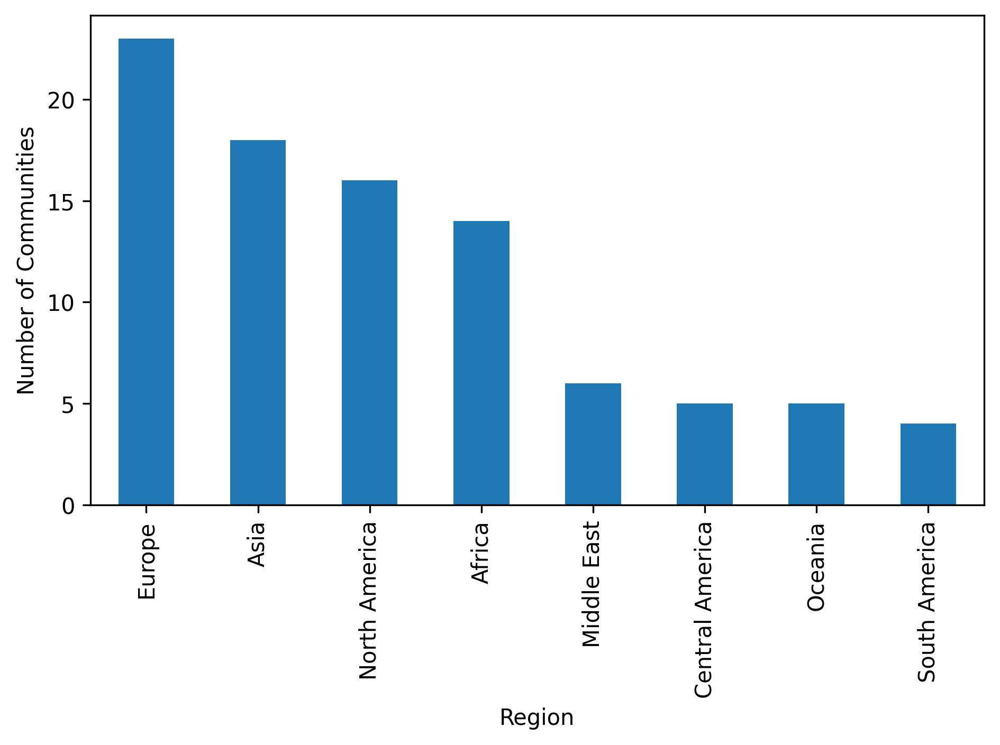

In [52]:
gov_df['Region'].value_counts().plot(kind='bar')
plt.ylabel("Number of Communities")

plt.tight_layout()
plt.savefig(fig_dir + 'communities_histogram_region.png')
plt.show()

Notes:
- Overrepresentation of European communities
- Need more representation of Oceania and Pacific Islanders, South America, Central America! 

## Mapping geographies


### Prep world map data to match the regions we have 

In [234]:
# Geopandas.dataset was deprecated
# Original naturalearth_lowres data is from: https://www.naturalearthdata.com/downloads/110m-cultural-vectors/
all_worldmap = gpd.read_file(
    "../data/naturalearth/ne_110m_admin_0_countries.shp"
)

In [235]:
all_worldmap

,featurecla,scalerank,LABELRANK,SOVEREIGNT,SOV_A3,ADM0_DIF,LEVEL,TYPE,TLC,ADMIN,ADM0_A3,GEOU_DIF,GEOUNIT,GU_A3,SU_DIF,SUBUNIT,SU_A3,BRK_DIFF,NAME,NAME_LONG,BRK_A3,BRK_NAME,BRK_GROUP,ABBREV,POSTAL,FORMAL_EN,FORMAL_FR,NAME_CIAWF,NOTE_ADM0,NOTE_BRK,NAME_SORT,NAME_ALT,MAPCOLOR7,MAPCOLOR8,MAPCOLOR9,MAPCOLOR13,POP_EST,POP_RANK,POP_YEAR,GDP_MD,GDP_YEAR,ECONOMY,INCOME_GRP,FIPS_10,ISO_A2,ISO_A2_EH,ISO_A3,ISO_A3_EH,ISO_N3,ISO_N3_EH,UN_A3,WB_A2,WB_A3,WOE_ID,WOE_ID_EH,WOE_NOTE,ADM0_ISO,ADM0_DIFF,ADM0_TLC,ADM0_A3_US,ADM0_A3_FR,ADM0_A3_RU,ADM0_A3_ES,ADM0_A3_CN,ADM0_A3_TW,ADM0_A3_IN,ADM0_A3_NP,ADM0_A3_PK,ADM0_A3_DE,ADM0_A3_GB,ADM0_A3_BR,ADM0_A3_IL,ADM0_A3_PS,ADM0_A3_SA,ADM0_A3_EG,ADM0_A3_MA,ADM0_A3_PT,ADM0_A3_AR,ADM0_A3_JP,ADM0_A3_KO,ADM0_A3_VN,ADM0_A3_TR,ADM0_A3_ID,ADM0_A3_PL,ADM0_A3_GR,ADM0_A3_IT,ADM0_A3_NL,ADM0_A3_SE,ADM0_A3_BD,ADM0_A3_UA,ADM0_A3_UN,ADM0_A3_WB,CONTINENT,REGION_UN,SUBREGION,REGION_WB,NAME_LEN,LONG_LEN,ABBREV_LEN,TINY,HOMEPART,MIN_ZOOM,MIN_LABEL,MAX_LABEL,LABEL_X,LABEL_Y,NE_ID,WIKIDATAID,NAME_AR,NAME_BN,NAME_DE,NAME_EN,NAME_ES,NAME_FA,NAME_FR,NAME_EL,NAME_HE,NAME_HI,NAME_HU,NAME_ID,NAME_IT,NAME_JA,NAME_KO,NAME_NL,NAME_PL,NAME_PT,NAME_RU,NAME_SV,NAME_TR,NAME_UK,NAME_UR,NAME_VI,NAME_ZH,NAME_ZHT,FCLASS_ISO,TLC_DIFF,FCLASS_TLC,FCLASS_US,FCLASS_FR,FCLASS_RU,FCLASS_ES,FCLASS_CN,FCLASS_TW,FCLASS_IN,FCLASS_NP,FCLASS_PK,FCLASS_DE,FCLASS_GB,FCLASS_BR,FCLASS_IL,FCLASS_PS,FCLASS_SA,FCLASS_EG,FCLASS_MA,FCLASS_PT,FCLASS_AR,FCLASS_JP,FCLASS_KO,FCLASS_VN,FCLASS_TR,FCLASS_ID,FCLASS_PL,FCLASS_GR,FCLASS_IT,FCLASS_NL,FCLASS_SE,FCLASS_BD,FCLASS_UA,geometry
0,Admin-0 country,1,6,Fiji,FJI,0,2,Sovereign country,1,Fiji,FJI,0,Fiji,FJI,0,Fiji,FJI,0,Fiji,Fiji,FJI,Fiji,None,Fiji,FJ,Republic of Fiji,None,Fiji,None,None,Fiji,None,5,1,2,2,8.899530e+05,11,2019,5496,2019,6. Developing region,4. Lower middle income,FJ,FJ,FJ,FJI,FJI,242,242,242,FJ,FJI,23424813,23424813,Exact WOE match as country,FJI,None,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,FJI,-99,-99,Oceania,Oceania,Melanesia,East Asia & Pacific,4,4,4,-99,1,0.0,3.0,8.0,177.975427,-17.826099,1159320625,Q712,فيجي,ফিজি,Fidschi,Fiji,Fiyi,فیجی,Fidji,Φίτζι,פיג'י,फ़िजी,Fidzsi-szigetek,Fiji,Figi,フィジー,피지,Fiji,Fidżi,Fiji,Фиджи,Fiji,Fiji,Фіджі,فجی,Fiji,斐济,斐濟,Admin-0 country,None,Admin-0 country,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((180 -16.06713, 180 -16.55522, ..."
1,Admin-0 country,1,3,United Republic of Tanzania,TZA,0,2,Sovereign country,1,United Republic of Tanzania,TZA,0,Tanzania,TZA,0,Tanzania,TZA,0,Tanzania,Tanzania,TZA,Tanzania,None,Tanz.,TZ,United Republic of Tanzania,None,Tanzania,None,None,Tanzania,None,3,6,2,2,5.800546e+07,16,2019,63177,2019,7. Least developed region,5. Low income,TZ,TZ,TZ,TZA,TZA,834,834,834,TZ,TZA,23424973,23424973,Exact WOE match as country,TZA,None,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,TZA,-99,-99,Africa,Africa,Eastern Africa,Sub-Saharan Africa,8,8,5,-99,1,0.0,3.0,8.0,34.959183,-6.051866,1159321337,Q924,تنزانيا,তানজানিয়া,Tansania,Tanzania,Tanzania,تانزانیا,Tanzanie,Τανζανία,טנזניה,तंज़ानिया,Tanzánia,Tanzania,Tanzania,タンザニア,탄자니아,Tanzania,Tanzania,Tanzânia,Танзания,Tanzania,Tanzanya,Танзанія,تنزانیہ,Tanzania,坦桑尼亚,坦尚尼亞,Admin-0 country,None,Admin-0 country,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,"POLYGON ((33.90371 -0.95, 34.07262 -1.05982, 3..."
2,Admin-0 country,1,7,Western Sahara,SAH,0,2,Indeterminate,1,Western Sahara,SAH,0,Western Sahara,SAH,0,Western Sahara,SAH,1,W. Sahara,Western Sahara,B28,W. Sahara,None,W. Sah.,WS,Sahrawi Arab Democratic Republic,None,Western Sahara,None,Self admin.; Claimed by Morocco,Western Sahara,None,4,7,4,4,6.032530e+05,11,2017,907,2007,7. Leas

In [236]:
worldmap = all_worldmap[['NAME', 'CONTINENT', 'REGION_UN', 'geometry']]

In [237]:
worldmap

,NAME,CONTINENT,REGION_UN,geometry
0,Fiji,Oceania,Oceania,"MULTIPOLYGON (((180 -16.06713, 180 -16.55522, ..."
1,Tanzania,Africa,Africa,"POLYGON ((33.90371 -0.95, 34.07262 -1.05982, 3..."
2,W. Sahara,Africa,Africa,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,Canada,North America,Americas,"MULTIPOLYGON (((-122.84 49, -122.97421 49.0025..."
4,United States of America,North America,Americas,"MULTIPOLYGON (((-122.84 49, -120 49, -117.0312..."
5,Kazakhstan,Asia,Asia,"POLYGON ((87.35997 49.21498, 86.59878 48.54918..."
6,Uzbekistan,Asia,Asia,"POLYGON ((55.96819 41.30864, 55.92892 44.99586..."
7,Papua New Guinea,Oceania,Oceania,"MULTIPOLYGON (((141.00021 -2.60015, 142.73525 ..."
8,Indonesia,Asia,Asia,"MULTIPOLYGON (((141.00021 -2.60015, 141.01706 ..."
9,Argentina,South America,Americas,"MULTIPOLYGON (((-68.63401 -52.63637, -68.25 -5..."


In [238]:
sorted(list(worldmap['NAME']))

['Afghanistan',
 'Albania',
 'Algeria',
 'Angola',
 'Antarctica',
 'Argentina',
 'Armenia',
 'Australia',
 'Austria',
 'Azerbaijan',
 'Bahamas',
 'Bangladesh',
 'Belarus',
 'Belgium',
 'Belize',
 'Benin',
 'Bhutan',
 'Bolivia',
 'Bosnia and Herz.',
 'Botswana',
 'Brazil',
 'Brunei',
 'Bulgaria',
 'Burkina Faso',
 'Burundi',
 'Cambodia',
 'Cameroon',
 'Canada',
 'Central African Rep.',
 'Chad',
 'Chile',
 'China',
 'Colombia',
 'Congo',
 'Costa Rica',
 'Croatia',
 'Cuba',
 'Cyprus',
 'Czechia',
 "Côte d'Ivoire",
 'Dem. Rep. Congo',
 'Denmark',
 'Djibouti',
 'Dominican Rep.',
 'Ecuador',
 'Egypt',
 'El Salvador',
 'Eq. Guinea',
 'Eritrea',
 'Estonia',
 'Ethiopia',
 'Falkland Is.',
 'Fiji',
 'Finland',
 'Fr. S. Antarctic Lands',
 'France',
 'Gabon',
 'Gambia',
 'Georgia',
 'Germany',
 'Ghana',
 'Greece',
 'Greenland',
 'Guatemala',
 'Guinea',
 'Guinea-Bissau',
 'Guyana',
 'Haiti',
 'Honduras',
 'Hungary',
 'Iceland',
 'India',
 'Indonesia',
 'Iran',
 'Iraq',
 'Ireland',
 'Israel',
 'Italy

In [239]:
# Add default regions for Oceania, Asia, Africa, and Europe
worldmap.loc[(worldmap['CONTINENT'] == 'Oceania'), 'Region'] = 'Oceania'
worldmap.loc[(worldmap['CONTINENT'] == 'Asia'), 'Region'] = 'Asia'
worldmap.loc[(worldmap['CONTINENT'] == 'Africa'), 'Region'] = 'Africa'
worldmap.loc[(worldmap['CONTINENT'] == 'Europe'), 'Region'] = 'Europe'

In [240]:
north_america_countries = [
    'Bahamas',
    'Canada',
    'Cuba',
    'Dominican Rep.',
    'Greenland',
    'Haiti',
    'Jamaica',
    'Mexico',
    'Puerto Rico',
    'Trinidad and Tobago',
    'United States of America'
]

In [241]:
south_america_countries = [
    'Argentina',
    'Bolivia',
    'Brazil',
    'Chile',
    'Colombia',
    'Ecuador',
    'Falkland Is.',
    'Guyana',
    'Paraguay',
    'Peru',
    'Suriname',
    'Uruguay',
    'Venezuela'
]

In [242]:
central_america_countries = [
    'Belize',
    'Costa Rica',
    'El Salvador',
    'Guatemala',
    'Honduras',
    'Nicaragua',
    'Panama'
]

In [243]:
middle_east_countries = [
    'Cyprus',
    'Egypt',
    'Iran',
    'Iraq',
    'Israel',
    'Jordan',
    'Kuwait',
    'Lebanon',
    'Oman',
    'Palestine',
    'Qatar',
    'Saudi Arabia',
    'Syria',
    'Turkey',
    'United Arab Emirates',
    'Yemen'
]

In [244]:
worldmap['NAME'].isin(central_america_countries)

0      False
1      False
2      False
3      False
4      False
5      False
6      False
7      False
8      False
9      False
10     False
11     False
12     False
13     False
14     False
15     False
16     False
17     False
18     False
19     False
20     False
21     False
22     False
23     False
24     False
25     False
26     False
27     False
28     False
29     False
30     False
31     False
32     False
33      True
34      True
35      True
36      True
37      True
38      True
39      True
40     False
41     False
42     False
43     False
44     False
45     False
46     False
47     False
48     False
49     False
50     False
51     False
52     False
53     False
54     False
55     False
56     False
57     False
58     False
59     False
60     False
61     False
62     False
63     False
64     False
65     False
66     False
67     False
68     False
69     False
70     False
71     False
72     False
73     False
74     False
75     False
76     False

In [245]:
# Add region for Central America
worldmap.loc[(worldmap['NAME'].isin(central_america_countries)), 'Region'] = 'Central America'

In [246]:
worldmap.loc[(worldmap['Region'] == 'Central America')]

,NAME,CONTINENT,REGION_UN,geometry,Region
33,Panama,North America,Americas,"POLYGON ((-77.35336 8.6705, -77.47472 8.52429,...",Central America
34,Costa Rica,North America,Americas,"POLYGON ((-82.5462 9.56613, -82.93289 9.47681,...",Central America
35,Nicaragua,North America,Americas,"POLYGON ((-83.65561 10.93876, -83.89505 10.726...",Central America
36,Honduras,North America,Americas,"POLYGON ((-83.14722 14.99583, -83.48999 15.016...",Central America
37,El Salvador,North America,Americas,"POLYGON ((-89.35333 14.42413, -89.05851 14.340...",Central America
38,Guatemala,North America,Americas,"POLYGON ((-92.22775 14.53883, -92.20323 14.830...",Central America
39,Belize,North America,Americas,"POLYGON ((-89.14308 17.80832, -89.15091 17.955...",Central America


In [247]:
# Add region for Middle East
worldmap.loc[(worldmap['NAME'].isin(middle_east_countries)), 'Region'] = 'Middle East'

In [248]:
worldmap.loc[(worldmap['Region'] == 'Middle East')]

,NAME,CONTINENT,REGION_UN,geometry,Region
76,Israel,Asia,Asia,"POLYGON ((35.71992 32.70919, 35.54567 32.39399...",Middle East
77,Lebanon,Asia,Asia,"POLYGON ((35.8211 33.27743, 35.5528 33.26427, ...",Middle East
79,Palestine,Asia,Asia,"POLYGON ((35.39756 31.48909, 34.92741 31.35344...",Middle East
83,Jordan,Asia,Asia,"POLYGON ((35.54567 32.39399, 35.71992 32.70919...",Middle East
84,United Arab Emirates,Asia,Asia,"POLYGON ((51.57952 24.2455, 51.75744 24.29407,...",Middle East
85,Qatar,Asia,Asia,"POLYGON ((50.81011 24.75474, 50.74391 25.48242...",Middle East
86,Kuwait,Asia,Asia,"POLYGON ((47.97452 29.97582, 48.18319 29.53448...",Middle East
87,Iraq,Asia,Asia,"POLYGON ((39.19547 32.16101, 38.79234 33.37869...",Middle East
88,Oman,Asia,Asia,"MULTIPOLYGON (((55.20834 22.70833, 55.23449 23...",Middle East
107,Iran,Asia,Asia,"POLYGON ((48.56797 29.92678, 48.01457 30.45246...",Middle East


In [249]:
# Add region for North America
worldmap.loc[(worldmap['NAME'].isin(north_america_countries)), 'Region'] = 'North America'
worldmap.loc[(worldmap['Region'] == 'North America')]

,NAME,CONTINENT,REGION_UN,geometry,Region
3,Canada,North America,Americas,"MULTIPOLYGON (((-122.84 49, -122.97421 49.0025...",North America
4,United States of America,North America,Americas,"MULTIPOLYGON (((-122.84 49, -120 49, -117.0312...",North America
16,Haiti,North America,Americas,"POLYGON ((-71.71236 19.71446, -71.62487 19.169...",North America
17,Dominican Rep.,North America,Americas,"POLYGON ((-71.7083 18.045, -71.68774 18.31666,...",North America
19,Bahamas,North America,Americas,"MULTIPOLYGON (((-78.98 26.79, -78.51 26.87, -7...",North America
22,Greenland,North America,Americas,"POLYGON ((-46.76379 82.62796, -43.40644 83.225...",North America
27,Mexico,North America,Americas,"POLYGON ((-117.12776 32.53534, -115.99135 32.6...",North America
45,Puerto Rico,North America,Americas,"POLYGON ((-66.28243 18.51476, -65.7713 18.4266...",North America
46,Jamaica,North America,Americas,"POLYGON ((-77.5696 18.49053, -76.89662 18.4008...",North America
47,Cuba,North America,Americas,"POLYGON ((-82.26815 23.18861, -81.40446 23.117...",North America


In [250]:
# Add region for South America
worldmap.loc[(worldmap['NAME'].isin(south_america_countries)), 'Region'] = 'South America'
worldmap.loc[(worldmap['Region'] == 'South America')]

,NAME,CONTINENT,REGION_UN,geometry,Region
9,Argentina,South America,Americas,"MULTIPOLYGON (((-68.63401 -52.63637, -68.25 -5...",South America
10,Chile,South America,Americas,"MULTIPOLYGON (((-68.63401 -52.63637, -68.63335...",South America
20,Falkland Is.,South America,Americas,"POLYGON ((-61.2 -51.85, -60 -51.25, -59.15 -51...",South America
28,Uruguay,South America,Americas,"POLYGON ((-57.62513 -30.21629, -56.97603 -30.1...",South America
29,Brazil,South America,Americas,"POLYGON ((-53.37366 -33.76838, -53.65054 -33.2...",South America
30,Bolivia,South America,Americas,"POLYGON ((-69.52968 -10.95173, -68.78616 -11.0...",South America
31,Peru,South America,Americas,"POLYGON ((-69.89364 -4.29819, -70.79477 -4.251...",South America
32,Colombia,South America,Americas,"POLYGON ((-66.87633 1.25336, -67.06505 1.13011...",South America
40,Venezuela,South America,Americas,"POLYGON ((-60.73357 5.20028, -60.60118 4.9181,...",South America
41,Guyana,South America,Americas,"POLYGON ((-56.53939 1.89952, -56.7827 1.86371,...",South America


In [251]:
worldmap

,NAME,CONTINENT,REGION_UN,geometry,Region
0,Fiji,Oceania,Oceania,"MULTIPOLYGON (((180 -16.06713, 180 -16.55522, ...",Oceania
1,Tanzania,Africa,Africa,"POLYGON ((33.90371 -0.95, 34.07262 -1.05982, 3...",Africa
2,W. Sahara,Africa,Africa,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948...",Africa
3,Canada,North America,Americas,"MULTIPOLYGON (((-122.84 49, -122.97421 49.0025...",North America
4,United States of America,North America,Americas,"MULTIPOLYGON (((-122.84 49, -120 49, -117.0312...",North America
5,Kazakhstan,Asia,Asia,"POLYGON ((87.35997 49.21498, 86.59878 48.54918...",Asia
6,Uzbekistan,Asia,Asia,"POLYGON ((55.96819 41.30864, 55.92892 44.99586...",Asia
7,Papua New Guinea,Oceania,Oceania,"MULTIPOLYGON (((141.00021 -2.60015, 142.73525 ...",Oceania
8,Indonesia,Asia,Asia,"MULTIPOLYGON (((141.00021 -2.60015, 141.01706 ...",Asia
9,Argentina,South America,Americas,"MULTIPOLYGON (((-68.63401 -52.63637, -68.25 -5...",South America


In [252]:
worldmap['Region'].value_counts()

Region
Africa             50
Europe             39
Asia               32
Middle East        16
South America      13
North America      11
Oceania             7
Central America     7
Name: count, dtype: int64

In [253]:
worldmap.loc[worldmap['Region'].isna()]

,NAME,CONTINENT,REGION_UN,geometry,Region
23,Fr. S. Antarctic Lands,Seven seas (open ocean),Africa,"POLYGON ((68.935 -48.625, 69.58 -48.94, 70.525...",NaN
159,Antarctica,Antarctica,Antarctica,"MULTIPOLYGON (((-48.66062 -78.04702, -48.1514 ...",NaN


In [254]:
worldmap.describe()

,NAME,CONTINENT,REGION_UN,geometry,Region
count,177,177,177,177,175
unique,177,8,6,177,8
top,Fiji,Africa,Africa,"MULTIPOLYGON (((180 -16.067132663642447, 180 -...",Africa
freq,1,51,52,1,50


#### Merge regions on world map

In [255]:
worldmap.head()

,NAME,CONTINENT,REGION_UN,geometry,Region
0,Fiji,Oceania,Oceania,"MULTIPOLYGON (((180 -16.06713, 180 -16.55522, ...",Oceania
1,Tanzania,Africa,Africa,"POLYGON ((33.90371 -0.95, 34.07262 -1.05982, 3...",Africa
2,W. Sahara,Africa,Africa,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948...",Africa
3,Canada,North America,Americas,"MULTIPOLYGON (((-122.84 49, -122.97421 49.0025...",North America
4,United States of America,North America,Americas,"MULTIPOLYGON (((-122.84 49, -120 49, -117.0312...",North America


In [256]:
test_map = worldmap.loc[(worldmap['Region'] == 'Central America')].union_all()

In [257]:
print(test_map)

POLYGON ((-77.24256649444008 7.935278225125444, -77.43110795765699 7.638061224798734, -77.7534138658614 7.709839789252143, -77.88157141794525 7.223771267114785, -78.21493608266012 7.512254950384161, -78.42916073272607 8.052041123888927, -78.18209570993864 8.319182440621773, -78.4354652574657 8.38770538984079, -78.62212053090394 8.718124497915028, -79.12030717641375 8.996092027213024, -79.55787736684519 8.932374986197146, -79.76057817251005 8.5845150822244, -80.16448116730334 8.333315944853595, -80.38265906443962 8.298408514840432, -80.4806892564973 8.09030752200107, -80.00368994822716 7.547524115423372, -80.276670701809 7.419754136581716, -80.42115800649708 7.271571966984765, -80.8864009264208 7.220541490096537, -81.05954281281473 7.817921047390597, -81.18971574575795 7.64790558515034, -81.51951473664468 7.706610012233909, -81.72131120474447 8.108962714058435, -82.13144120962892 8.175392767769637, -82.39093441438257 8.29236237226229, -82.82008134635042 8.290863755725823, -82.8509580146

In [258]:
regions_list = list(gov_df['Region'].unique())

In [259]:
regions_list

['Europe',
 'Asia',
 'Middle East',
 'Central America',
 'Africa',
 'North America',
 'South America',
 'Oceania']

In [260]:
region_map = pd.DataFrame(columns=['Region', 'geometry'])
region_map['Region'] = regions_list

In [261]:
region_map

,Region,geometry
0,Europe,NaN
1,Asia,NaN
2,Middle East,NaN
3,Central America,NaN
4,Africa,NaN
5,North America,NaN
6,South America,NaN
7,Oceania,NaN


In [267]:
worldmap['Region'].value_counts()

Region
Africa             50
Europe             39
Asia               32
Middle East        16
South America      13
North America      11
Oceania             7
Central America     7
Name: count, dtype: int64

### Plot communities into world map

In [269]:
from shapely.ops import unary_union
import pandas as pd

# Count communities per region
region_counts = (
    gov_df['Region']
    .value_counts()
    .rename('count')
    .reset_index()
    .rename(columns={'index': 'Region'})
)

# Dissolve geometries in worldmap by region
region_geoms = worldmap.groupby('Region')['geometry'].apply(unary_union).reset_index()

# Merge geometries and counts into region_map
region_map = (
    region_map.drop(columns='geometry', errors='ignore')  # remove old column if exists
    .merge(region_geoms, on='Region', how='left')
    .merge(region_counts, on='Region', how='left')
)


In [272]:
region_map

,Region,geometry,count
0,Europe,"MULTIPOLYGON (((-53.555 2.335, -53.779 2.377, ...",23
1,Asia,"MULTIPOLYGON (((105.857 -4.306, 105.818 -5.852...",18
2,Middle East,"MULTIPOLYGON (((25 25.682, 25 29.239, 24.7 30....",6
3,Central America,"POLYGON ((-77.243 7.935, -77.431 7.638, -77.75...",5
4,Africa,"MULTIPOLYGON (((-11.439 6.786, -11.708 6.86, -...",14
5,North America,"MULTIPOLYGON (((-155.222 19.24, -155.542 19.08...",16
6,South America,"MULTIPOLYGON (((-68.64 -55.58, -69.232 -55.499...",4
7,Oceania,"MULTIPOLYGON (((147.914 -43.212, 147.565 -42.9...",5


In [276]:
# Check that all communities are accounted for
region_map['count'].sum()

np.int64(91)

In [275]:
gov_df.describe()

,Time span: Start,Time span: End,is_SCCS,access_mechanisms_include_property_requirement,access_mechanisms_include_heredity,access_mechanisms_include_life_appointment,decision_making_mechanisms_include_board_committee,decision_making_mechanisms_include_president_consul_chief_executive,decision_making_mechanisms_include_quorum,enforcement_mechanisms_include_capital_punishment,decision_making_mechanisms_include_council_local,enforcement_mechanisms_include_self-help,decision_making_mechanisms_include_assembly_central,decision_making_mechanisms_include_turnover_rotation,enforcement_mechanisms_include_fines,decision_making_mechanisms_include_bureaucracy,decision_making_mechanisms_include_frequent_and_or_regular_meetings,decision_making_mechanisms_include_power_fluidity,enforcement_mechanisms_include_negotiation,decision_making_mechanisms_include_temporary_position_of_power_term_limits,decision_making_mechanisms_include_alliance,decision_making_mechanisms_include_lobbying,enforcement_mechanisms_include_monitoring,decision_making_mechanisms_include_consultation,decision_making_mechanisms_include_magistrate_official,decision_making_mechanisms_include_gathering,enforcement_mechanisms_include_civil_disobedience,enforcement_mechanisms_include_arbitration,decision_making_mechanisms_include_leader_first_among_equals,decision_making_mechanisms_include_secret_ballot,decision_making_mechanisms_include_veto,decision_making_mechanisms_include_council_central_,access_mechanisms_include_screening_process,enforcement_mechanisms_include_judicial_review,decision_making_mechanisms_include_petition,access_mechanisms_include_child_participation,decision_making_mechanisms_include_constitution,decision_making_mechanisms_include_coalition,access_mechanisms_include_matriarchy,enforcement_mechanisms_include_destruction_of_property,decision_making_mechanisms_include_rule_of_law,access_mechanisms_include_meritocracy,access_mechanisms_include_dreaming,decision_making_mechanisms_include_dual-sex_political_system,decision_making_mechanisms_include_public_meetings,enforcement_mechanisms_include_corporal_punishment_violence_against_perpetrator,enforcement_mechanisms_include_criticism_mocking_joking,decision_making_mechanisms_include_balance_of_power,access_mechanisms_include_open_political_unit,access_mechanisms_include_female_participation,decision_making_mechanisms_include_kingchief-as-figurehead,access_mechanisms_include_matrilineality,decision_making_mechanisms_include_delegation,access_mechanisms_include_enfranchisement,decision_making_mechanisms_include_agenda_setting,decision_making_mechanisms_include_group_voting,decision_making_mechanisms_include_majority_voting,enforcement_mechanisms_include_seizing_of_property,enforcement_mechanisms_include_litigation,decision_making_mechanisms_include_ratification_acclamation_only,enforcement_mechanisms_include_tribunal_court_,access_mechanisms_include_induction_rite_ceremony,enforcement_mechanisms_include_graduated_sanctions,access_mechanisms_include_blood_relations,decision_making_mechanisms_include_word_of_mouth,decision_making_mechanisms_include_confederacy,access_mechanisms_include_lottery_random_selection,decision_making_mechanisms_include_checks_and_balances,access_mechanisms_include_co-optation,decision_making_mechanisms_include_autocratic_leader_unbound,decision_making_mechanisms_include_vote_by_proxy,enforcement_mechanisms_include_reputational_risk,decision_making_mechanisms_include_assembly_local,enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,access_mechanisms_include_patronage_for_office,access_mechanisms_include_payment_for_occupying_office,decision_making_mechanisms_include_mandate,decision_making_mechanisms_include_plurality_voting,decision_making_mechanisms_include_assembly_elite,decision_making_mechanisms_include_vote_by_show_of_hands,access_mechanisms_include_age_boundaries,access_mechanisms_include_gerontocracy,enforcement_mechanisms_include_paying_damages_compensation,enfo

In [279]:
# Convert to GeoDataFrame
region_map = gpd.GeoDataFrame(region_map, geometry='geometry')
region_map.crs = worldmap.crs  # ensure coordinates match

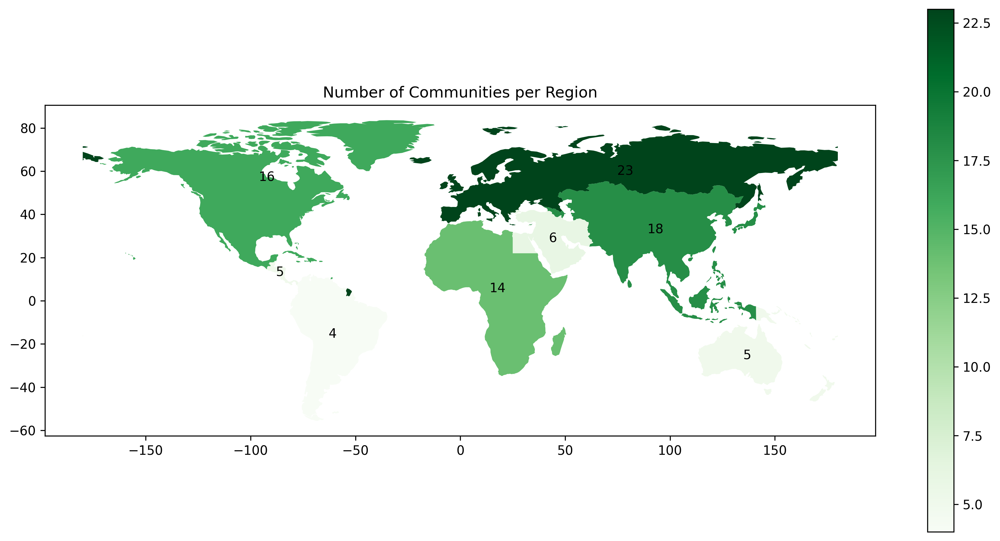

In [284]:
ax = region_map.plot(
    column='count',
    cmap='Greens',
    legend=True,
    figsize=(12, 6)
)

# Add labels at region centroids
for idx, row in region_map.iterrows():
    if row['geometry'].is_empty:
        continue  # skip empty geometries
    centroid = row['geometry'].centroid
    ax.annotate(
        text=int(row['count']),
        xy=(centroid.x, centroid.y),
        ha='center',
        va='center',
        fontsize=10,
        color='black',
    )

plt.title("Number of Communities per Region")
plt.tight_layout()
plt.savefig(fig_dir + 'communities_map_region.png')
plt.show()

## Time Span

Note:
- Change Time span to "Time span: Start" and "Time span: Stop"

In [285]:
gov_df['Time span: Start'].value_counts()

Time span: Start
 1800    13
 1700    11
 1900     8
 1500     7
 900      5
 1600     4
 1200     4
 1000     3
 1300     3
-1500     3
 1100     3
 1400     2
-480      2
-4100     1
-1550     1
-600      1
 1081     1
-510      1
-1894     1
 1650     1
-1800     1
-200      1
 930      1
 1450     1
 400      1
-2700     1
-2400     1
-1200     1
-771      1
-400      1
-900      1
-508      1
-1920     1
 0        1
 300      1
 1750     1
Name: count, dtype: int64

<Axes: xlabel='Time span: Start'>

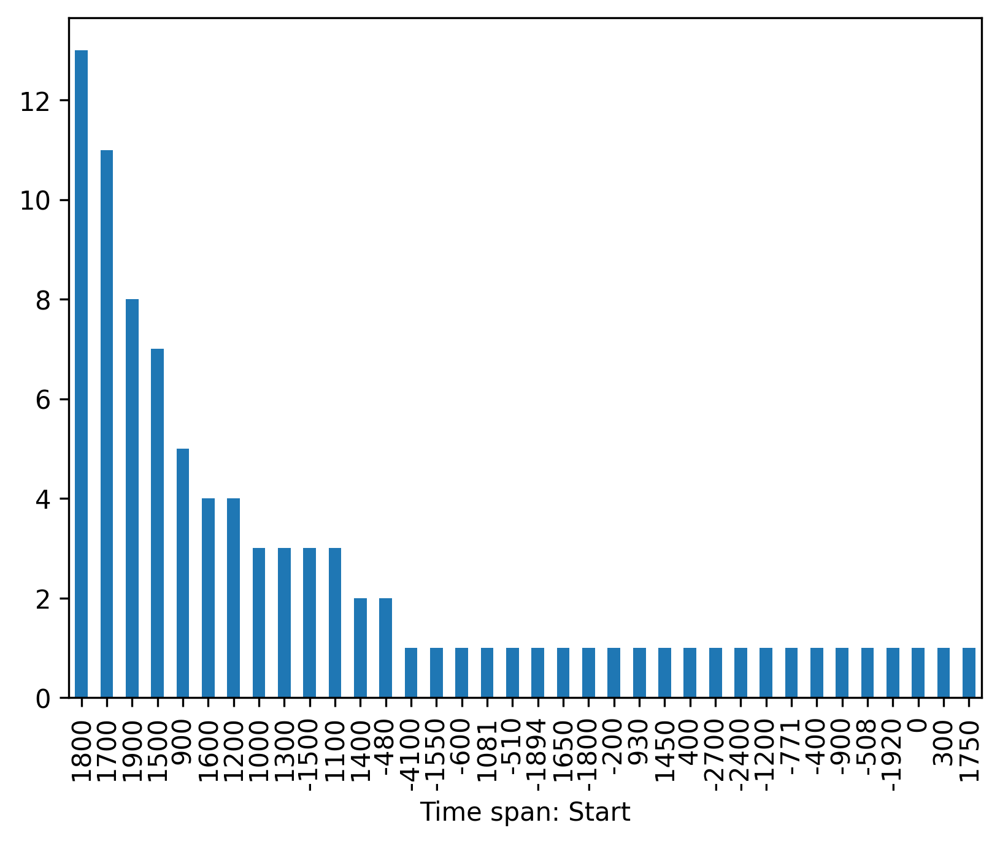

In [286]:
gov_df['Time span: Start'].value_counts().plot(kind='bar')

In [287]:
time_span_start_dates = gov_df['Time span: Start'].unique()

In [288]:
time_span_start_dates_order = sorted(time_span_start_dates)

In [289]:
time_span_start_dates_order

[np.int64(-4100),
 np.int64(-2700),
 np.int64(-2400),
 np.int64(-1920),
 np.int64(-1894),
 np.int64(-1800),
 np.int64(-1550),
 np.int64(-1500),
 np.int64(-1200),
 np.int64(-900),
 np.int64(-771),
 np.int64(-600),
 np.int64(-510),
 np.int64(-508),
 np.int64(-480),
 np.int64(-400),
 np.int64(-200),
 np.int64(0),
 np.int64(300),
 np.int64(400),
 np.int64(900),
 np.int64(930),
 np.int64(1000),
 np.int64(1081),
 np.int64(1100),
 np.int64(1200),
 np.int64(1300),
 np.int64(1400),
 np.int64(1450),
 np.int64(1500),
 np.int64(1600),
 np.int64(1650),
 np.int64(1700),
 np.int64(1750),
 np.int64(1800),
 np.int64(1900)]

<Axes: xlabel='Time span: Start'>

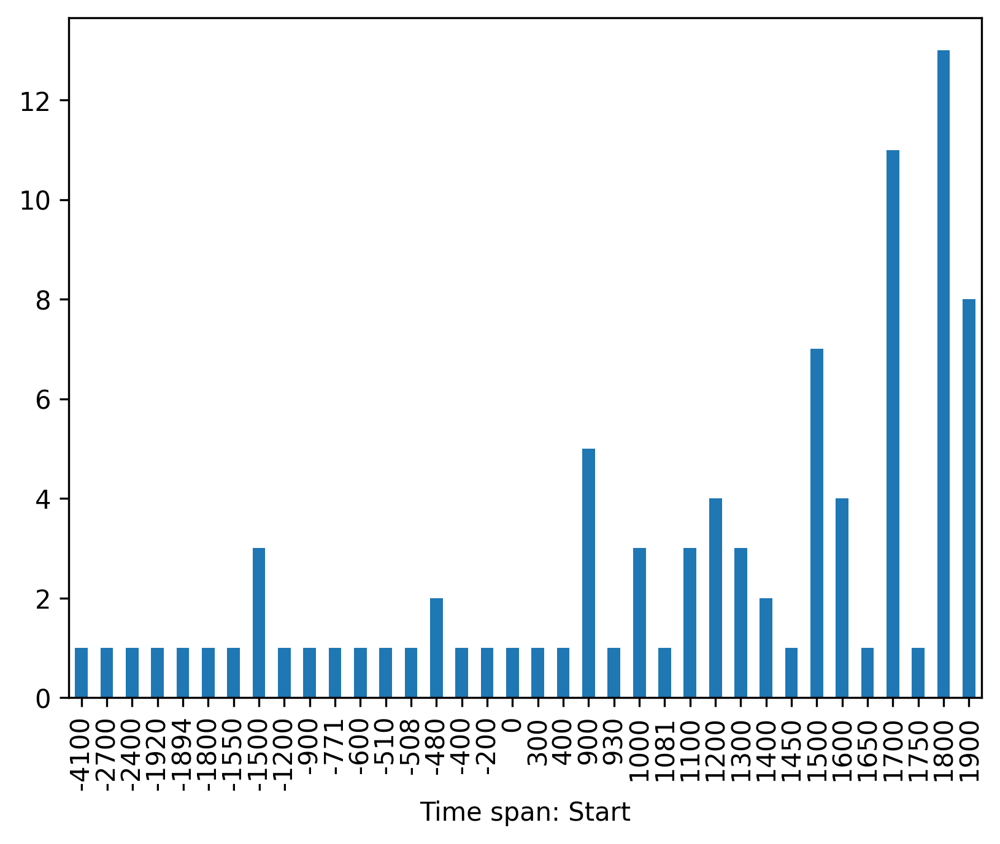

In [290]:
gov_df['Time span: Start'].value_counts().loc[time_span_start_dates_order].plot.bar()

In [291]:
gov_df['Time span: End'].value_counts()

Time span: End
 1900    24
 1800     9
 1600     6
 2000     5
 2023     5
 1850     4
 1400     3
-27       3
-500      3
 1200     2
 1300     2
-300      2
 1521     1
-1760     1
 1262     1
-3300     1
 1406     1
-1595     1
 1950     1
 1700     1
 1560     1
 0        1
 1804     1
 1100     1
-1000     1
-2300     1
-700      1
-221      1
 1500     1
-100      1
-600      1
-322      1
-1800     1
 700      1
 1880     1
Name: count, dtype: int64

In [292]:
# gov_df['Time span: End'].value_counts().plot(kind='bar')

<Axes: xlabel='Time span: End'>

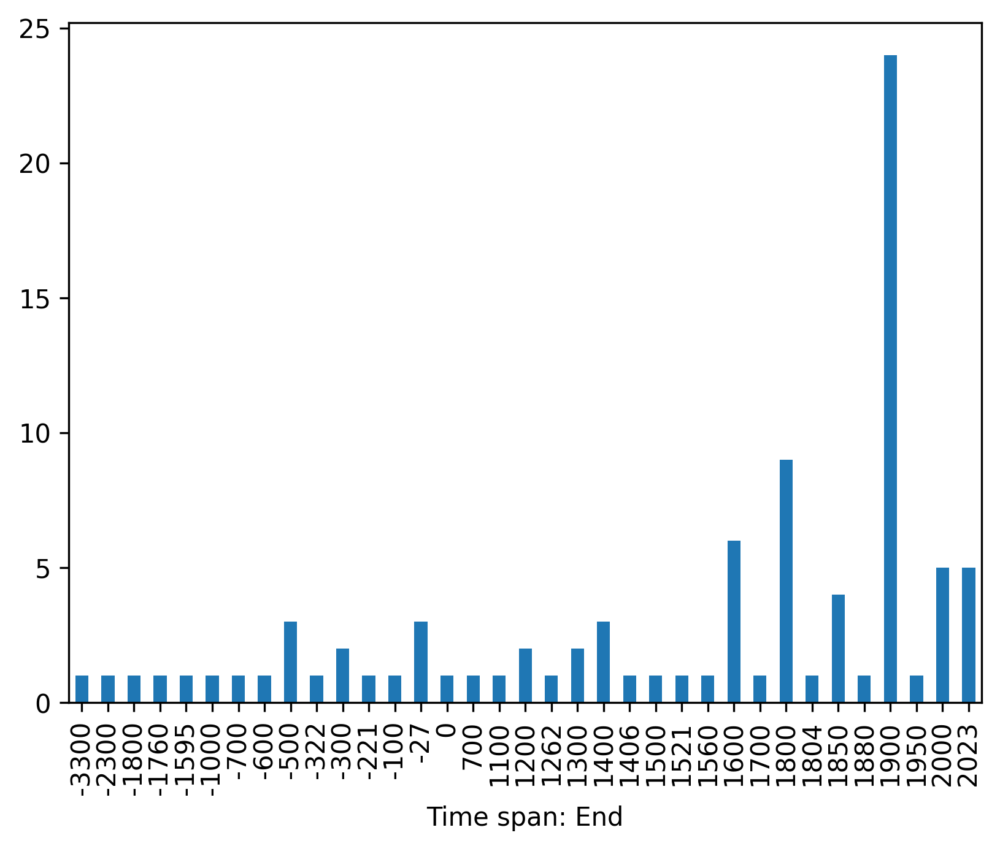

In [293]:
time_span_end_dates = gov_df['Time span: End'].unique()
time_span_end_dates_order = sorted(time_span_end_dates)

gov_df['Time span: End'].value_counts().loc[time_span_end_dates_order].plot.bar()

In [294]:
gov_df[['Time span: Start', 'Time span: End', 'Time span: Duration', 'Name']].head()

,Time span: Start,Time span: End,Time span: Duration,Name
0,-200,0,200,Aedui (Celtic Oppida)
1,1900,2023,123,Akha
2,300,1200,900,Amalfi
3,0,700,700,Arab nomads
4,-1920,-1800,120,Assur


In [295]:
dates_df = gov_df[['Time span: Start', 'Time span: Duration', 'Name']]

In [296]:
dates_df.head()

,Time span: Start,Time span: Duration,Name
0,-200,200,Aedui (Celtic Oppida)
1,1900,123,Akha
2,300,900,Amalfi
3,0,700,Arab nomads
4,-1920,120,Assur


In [297]:
dates_tuples = [tuple(x) for x in dates_df.to_numpy()]

In [298]:
dates_tuples

[(-200, 200, 'Aedui (Celtic Oppida)'),
 (1900, 123, 'Akha'),
 (300, 900, 'Amalfi'),
 (0, 700, 'Arab nomads'),
 (-1920, 120, 'Assur'),
 (-508, 186, 'Athens (Classical Period)'),
 (1100, 500, 'Aztec City-States'),
 (-900, 300, 'Babylonia'),
 (-400, 300, 'Carthage'),
 (900, 600, 'Central African communities'),
 (-771, 550, 'China (Spring and Autumn)'),
 (-1200, 500, 'Circassians'),
 (1200, 200, 'Cologne'),
 (900, 300, 'Communes (Medieval Europe)'),
 (1500, 300, 'Dutch Republic'),
 (-2400, 100, 'Ebla '),
 (-2700, 1700, 'Egypt '),
 (400, 700, 'England (Anglo Saxon)'),
 (1900, 100, 'G/wi'),
 (1300, 300, 'Genoa (doge)'),
 (1000, 300, 'Genoa (podesta)'),
 (-480, 453, 'Greek democracies'),
 (-480, 453, 'Greek oligarchies'),
 (1100, 700, 'Haudenosanee (Iroquois)'),
 (1450, 354, 'Hausa City-States'),
 (1900, 123, 'Hmong villages'),
 (930, 332, 'Iceland '),
 (900, 660, 'Igbo People'),
 (1400, 500, 'Ijo of the Eastern Niger Delta'),
 (1200, 600, 'Imperial and Free Towns of the Holy Roman Empire'),


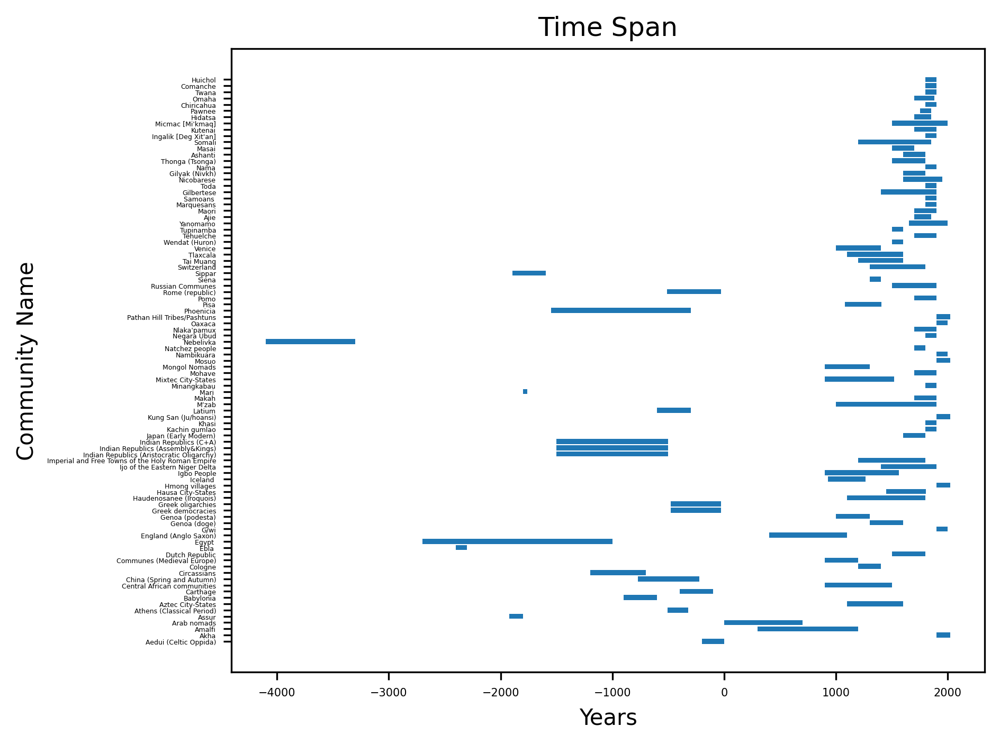

In [299]:
# create figure and plot
fig, ax = plt.subplots()
labels = []
for i, (start, duration, label) in enumerate(dates_tuples):
    labels.append(label)
    ax.broken_barh([(start, duration)], (i-0.4,0.8))

# set yticks at the middle of the bars
ax.set_yticks(range(len(dates_tuples)))
ax.set_yticklabels(labels)
ax.tick_params(axis='x', labelsize=5)
ax.tick_params(axis='y', labelsize=3)

ax.set_xlabel('Years')
ax.set_ylabel('Community Name')

plt.title('Time Span')
# plt.grid(True)
# plt.figure(figsize=(80, 80))

plt.tight_layout()
plt.savefig(fig_dir + 'communities_timeline.png')
plt.show()

/ Notes / TODO:
- x Mechanisms, Institution, Culture/Norms etc. 
- x Plot time span 
- Cluster communities by similarity (PCA) - can check w Seth
- CGI-specific analyses 

/
- Address remaining questions in doc: https://docs.google.com/document/d/1f1Qa25OGWWrvK5xrZjuLeqYn4WkgnyUH/edit
- CGIs: 
  - what do CGIs look like? 
  - How are they connected with other institutions? 
  - How many cgis per community, on average? 
  - how many non cgis, on average? How many institutions per community, on average? 
  - Does the variation interact with size, time or space?
  - Identify patterns in terms of:
      - Functions of the CGI
      - Level of jurisdiction (local/central) and membership (elite/commoners)
      - Within a type of CGI (say, assembly), what are the main sources of variation in terms of function and membership?
      - Possible interactions with size
  
- Mechanisms:
  - How many mechanisms in CGIs, on average? 
  - how many mechanisms in the community? 
  - What mechanisms prevail? 
  - What mechanisms prevail in CGIs compared to non-CGIs?
  - Does the variation interact with size, time or space?
  
- Region:
  - can we identify any regional characteristics? 
  - We should also provide a simple breakdown of each of the three features (time, place, size). 
  - How many communities in each?

/
- CGI network structures?

### TODO 

1. Finish descriptive analysis 
- x CGI analysis -- histogram for mechanisms
- x Timeline plotting 
- x Geography mapping
- x Clean up + reformat size


2. Mechanisms analysis 
- Mechanisms x geography, mechanisms x time, mechanisms x size


3. CGI Analysis 
- CGI-mechanism histogram 
- CGI Mechanisms x geography, mechanisms x time, mechanisms x size
- Correlation matrices for mechanisms and CGI mechanisms


4. Similarity clustering 
- Similarity clustering for Communities 

# Pairplots

In [300]:
data_df = gov_df.select_dtypes(include=[np.number]).dropna()

In [301]:
# sns.pairplot(data_df)

## TODO: Clustering communities by similarity